In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix,roc_auc_score, roc_curve


In [7]:
from pandas_profiling import ProfileReport

In [10]:
df=pd.read_csv("winequality-red.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [11]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
X=df.drop(columns='quality')


In [13]:
Y=df['quality']

In [17]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.20,random_state=200)
print("x train size :",x_train.shape)
print("x test size :",x_test.shape)
print("y train size :",y_train.shape)
print("y test size :",x_test.shape)


x train size : (1279, 11)
x test size : (320, 11)
y train size : (1279,)
y test size : (320, 11)


In [19]:
dt_model=DecisionTreeClassifier()
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [20]:
y_test_pred=dt_model.predict(x_test)
y_test_pred

array([7, 6, 6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6,
       5, 6, 7, 7, 5, 6, 6, 6, 5, 5, 7, 5, 5, 7, 6, 6, 7, 7, 5, 6, 5, 5,
       3, 6, 4, 5, 6, 6, 6, 6, 5, 7, 7, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 7,
       7, 7, 6, 7, 5, 5, 5, 5, 5, 7, 5, 5, 5, 6, 5, 5, 6, 6, 5, 6, 5, 6,
       5, 5, 5, 6, 5, 5, 6, 6, 7, 7, 7, 5, 5, 7, 5, 7, 5, 6, 6, 6, 5, 5,
       5, 5, 7, 5, 6, 6, 5, 6, 5, 5, 5, 6, 5, 7, 4, 6, 6, 4, 5, 5, 5, 5,
       5, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 4, 5, 6, 6, 5, 5, 6, 5, 7,
       5, 5, 7, 6, 5, 7, 5, 7, 5, 6, 5, 6, 6, 4, 6, 5, 6, 5, 6, 5, 5, 6,
       5, 5, 5, 5, 5, 5, 4, 6, 6, 7, 5, 5, 6, 7, 6, 5, 7, 5, 7, 5, 5, 5,
       5, 4, 7, 8, 7, 6, 6, 5, 5, 5, 6, 6, 5, 5, 5, 6, 7, 5, 6, 5, 5, 5,
       7, 5, 5, 6, 6, 6, 7, 7, 4, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 7,
       5, 7, 5, 5, 6, 5, 5, 5, 8, 6, 5, 5, 4, 6, 5, 5, 6, 5, 5, 5, 7, 6,
       5, 6, 5, 5, 5, 5, 6, 6, 5, 5, 6, 5, 5, 6, 5, 6, 5, 7, 5, 7, 6, 5,
       5, 5, 5, 6, 6, 6, 5, 6, 5, 6, 4, 7, 6, 6, 8,

In [21]:
dt_model.score(x_train,y_train)

1.0

In [22]:
dt_model.score(x_test,y_test)

0.646875

[Text(599.3301935866522, 1064.55, 'X[10] <= 10.525\ngini = 0.648\nsamples = 1279\nvalue = [9, 43, 535, 510, 165, 17]'),
 Text(390.9145875466708, 1019.25, 'X[6] <= 98.5\ngini = 0.552\nsamples = 782\nvalue = [6, 28, 449, 266, 31, 2]'),
 Text(203.80552854698195, 973.95, 'X[9] <= 0.555\ngini = 0.574\nsamples = 690\nvalue = [6, 27, 366, 259, 30, 2]'),
 Text(79.45799626633479, 928.6500000000001, 'X[10] <= 9.75\ngini = 0.474\nsamples = 210\nvalue = [3, 15, 144, 47, 1, 0]'),
 Text(29.977598008711883, 883.35, 'X[10] <= 9.05\ngini = 0.357\nsamples = 131\nvalue = [1, 8, 103, 19, 0, 0]'),
 Text(11.11138767890479, 838.05, 'X[0] <= 7.8\ngini = 0.611\nsamples = 6\nvalue = [0, 2, 1, 3, 0, 0]'),
 Text(7.4075917859365275, 792.75, 'X[0] <= 7.15\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Text(3.7037958929682637, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(11.11138767890479, 747.45, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(14.815183571873055, 7

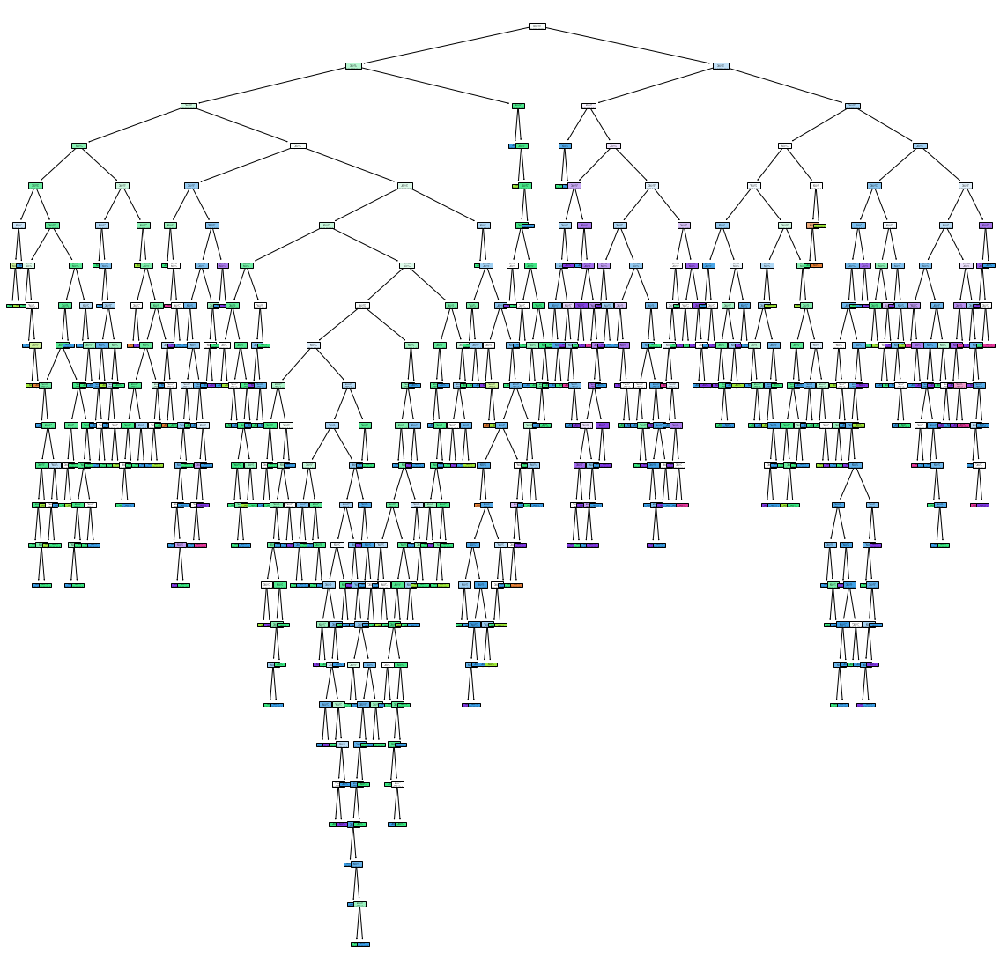

In [35]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [24]:
dt_en=DecisionTreeClassifier(criterion="entropy")
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [25]:
dt_en.score(x_train,y_train)

1.0

In [27]:
dt_en.score(x_test,y_test)

0.64375

In [30]:
import sklearn
sklearn.__version__

'0.24.1'

[Text(170.98775694098606, 212.49818181818182, 'X[10] <= 10.525\nentropy = 1.734\nsamples = 1279\nvalue = [9, 43, 535, 510, 165, 17]'),
 Text(71.1926752365538, 202.61454545454546, 'X[9] <= 0.555\nentropy = 1.421\nsamples = 782\nvalue = [6, 28, 449, 266, 31, 2]'),
 Text(36.78131474103586, 192.73090909090908, 'X[1] <= 0.812\nentropy = 1.159\nsamples = 248\nvalue = [3, 15, 179, 50, 1, 0]'),
 Text(23.409322709163348, 182.84727272727272, 'X[10] <= 9.75\nentropy = 1.017\nsamples = 218\nvalue = [0, 9, 162, 46, 1, 0]'),
 Text(11.204462151394424, 172.96363636363637, 'X[10] <= 9.35\nentropy = 0.788\nsamples = 138\nvalue = [0, 6, 115, 17, 0, 0]'),
 Text(5.335458167330678, 163.07999999999998, 'X[6] <= 48.0\nentropy = 0.787\nsamples = 34\nvalue = [0, 5, 28, 1, 0, 0]'),
 Text(2.134183266932271, 153.19636363636363, 'X[8] <= 3.325\nentropy = 0.961\nsamples = 13\nvalue = [0, 5, 8, 0, 0, 0]'),
 Text(1.0670916334661356, 143.31272727272727, 'entropy = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(3

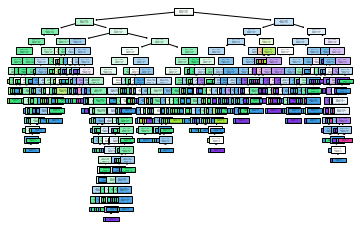

In [34]:
tree.plot_tree(dt_en,filled=True)

In [67]:
df1=df.head(100)
x1=df1.drop(columns='quality')
y1=df1['quality']

In [68]:
dt_model1=DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

In [69]:
dt_model1.score(x_test,y_test)

0.503125

In [70]:
set(y1)

{4, 5, 6, 7}

[Text(214.23214285714283, 1045.3846153846155, 'density <= 0.994\ngini = 0.509\nsamples = 100\nvalue = [7, 66, 22, 5]\nclass = 5'),
 Text(79.71428571428571, 961.7538461538462, 'sulphates <= 0.58\ngini = 0.375\nsamples = 4\nvalue = [3, 0, 1, 0]\nclass = 4'),
 Text(39.857142857142854, 878.123076923077, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]\nclass = 4'),
 Text(119.57142857142856, 878.123076923077, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 6'),
 Text(348.75, 961.7538461538462, 'volatile acidity <= 0.285\ngini = 0.475\nsamples = 96\nvalue = [4, 66, 21, 5]\nclass = 5'),
 Text(199.28571428571428, 878.123076923077, 'alcohol <= 10.15\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]\nclass = 6'),
 Text(159.42857142857142, 794.4923076923078, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2, 0]\nclass = 6'),
 Text(239.1428571428571, 794.4923076923078, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(498.21428571428567, 878.123076923077, 'total sulfur dioxide <= 21

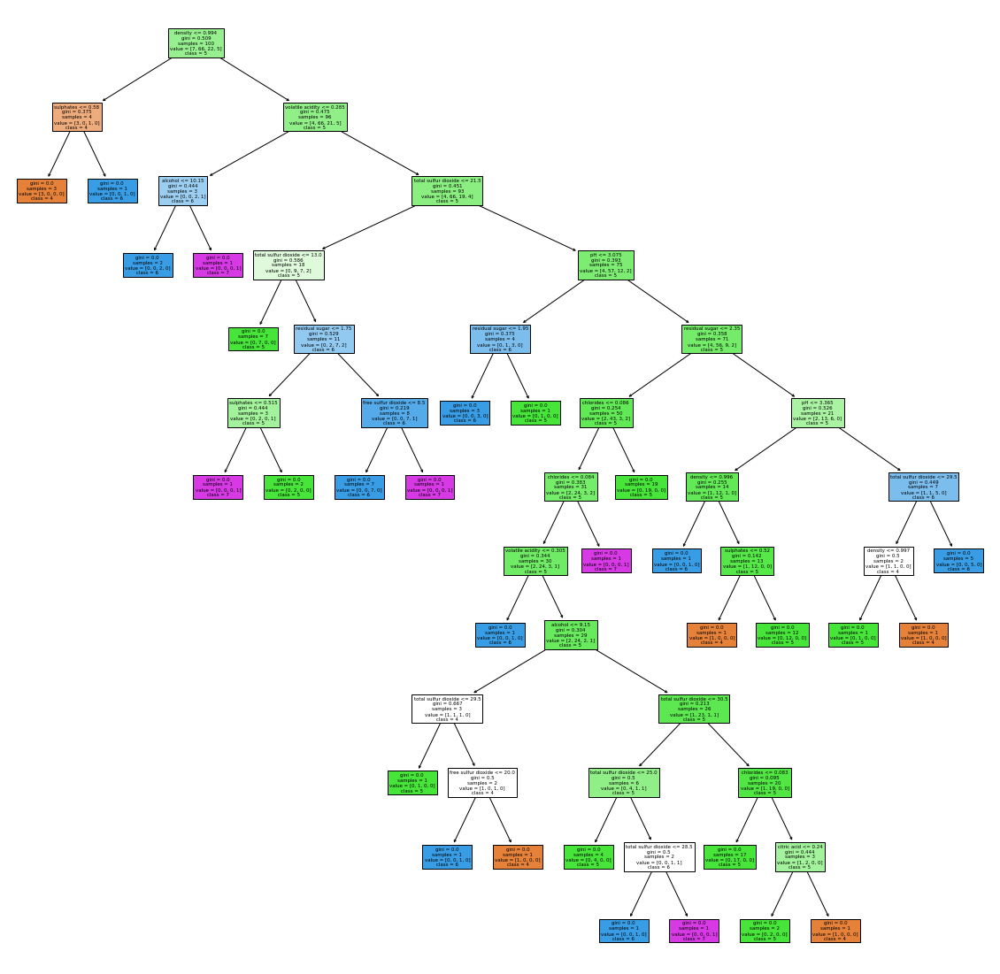

In [71]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True,class_names=[str(i) for i in set(y1)],feature_names=x1.columns)

In [72]:
path=dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha=path['ccp_alphas']
ccp_alpha

array([0.        , 0.0095    , 0.01      , 0.01      , 0.01      ,
       0.01296667, 0.01333333, 0.01333333, 0.015     , 0.015     ,
       0.0175    , 0.01785714, 0.02142857, 0.02734848, 0.02866349,
       0.02986439, 0.03755833])

In [73]:
path.ccp_alphas

array([0.        , 0.0095    , 0.01      , 0.01      , 0.01      ,
       0.01296667, 0.01333333, 0.01333333, 0.015     , 0.015     ,
       0.0175    , 0.01785714, 0.02142857, 0.02734848, 0.02866349,
       0.02986439, 0.03755833])

In [74]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_model2.append(dt_m)

In [75]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.009499999999999998),
 DecisionTreeClassifier(ccp_alpha=0.01),
 DecisionTreeClassifier(ccp_alpha=0.01),
 DecisionTreeClassifier(ccp_alpha=0.01),
 DecisionTreeClassifier(ccp_alpha=0.012966666666666673),
 DecisionTreeClassifier(ccp_alpha=0.013333333333333332),
 DecisionTreeClassifier(ccp_alpha=0.013333333333333332),
 DecisionTreeClassifier(ccp_alpha=0.015),
 DecisionTreeClassifier(ccp_alpha=0.015),
 DecisionTreeClassifier(ccp_alpha=0.0175),
 DecisionTreeClassifier(ccp_alpha=0.017857142857142853),
 DecisionTreeClassifier(ccp_alpha=0.02142857142857143),
 DecisionTreeClassifier(ccp_alpha=0.027348484848484848),
 DecisionTreeClassifier(ccp_alpha=0.02866349206349203),
 DecisionTreeClassifier(ccp_alpha=0.02986439393939398),
 DecisionTreeClassifier(ccp_alpha=0.037558333333333194)]

In [76]:
[i.fit(x1,y1) for i in dt_model2]

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.009499999999999998),
 DecisionTreeClassifier(ccp_alpha=0.01),
 DecisionTreeClassifier(ccp_alpha=0.01),
 DecisionTreeClassifier(ccp_alpha=0.01),
 DecisionTreeClassifier(ccp_alpha=0.012966666666666673),
 DecisionTreeClassifier(ccp_alpha=0.013333333333333332),
 DecisionTreeClassifier(ccp_alpha=0.013333333333333332),
 DecisionTreeClassifier(ccp_alpha=0.015),
 DecisionTreeClassifier(ccp_alpha=0.015),
 DecisionTreeClassifier(ccp_alpha=0.0175),
 DecisionTreeClassifier(ccp_alpha=0.017857142857142853),
 DecisionTreeClassifier(ccp_alpha=0.02142857142857143),
 DecisionTreeClassifier(ccp_alpha=0.027348484848484848),
 DecisionTreeClassifier(ccp_alpha=0.02866349206349203),
 DecisionTreeClassifier(ccp_alpha=0.02986439393939398),
 DecisionTreeClassifier(ccp_alpha=0.037558333333333194)]

In [77]:
train_score=[i.score(x1,y1) for i in dt_model2]

In [78]:
test_score=[i.score(x_test,y_test) for i in dt_model2]

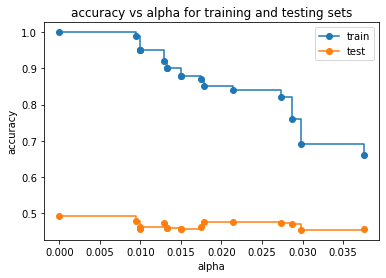

In [79]:
fig,ax=plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha,train_score,marker="o",label="train",drawstyle="steps-post")
ax.plot(ccp_alpha,test_score,marker="o",label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [80]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.038)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.038, random_state=0)

In [81]:
train_score=dt_model_ccp.score(x1,y1)
train_score

0.66

In [82]:
test_score=dt_model_ccp.score(x_test,y_test)
test_score

0.45625

### GridSearchCV

In [83]:
grid_pram={"criterion":['gini','entropy'],
          "splitter":['best','random'],
          "max_depth":range(2,40,1),
          "min_samples_split":range(2,10,1),
          "min_samples_leaf":range(1,10,1)
          }

In [84]:
dt_GS=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram,cv=5,n_jobs=-1)
dt_GS.fit(x1,y1)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.038, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [85]:
dt_GS.best_params_

{'criterion': 'entropy',
 'max_depth': 3,
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'splitter': 'random'}

In [86]:
dt_ccp_new=DecisionTreeClassifier(criterion='entropy',max_depth= 3,min_samples_leaf=4,min_samples_split=2,splitter='random')
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=4,
                       splitter='random')

In [87]:
train_score=dt_ccp_new.score(x1,y1)
train_score

0.69

In [89]:
test_score=dt_ccp_new.score(x_test,y_test)
test_score

0.39375

[Text(125.55000000000001, 190.26, 'density <= 0.995\nentropy = 1.361\nsamples = 100\nvalue = [7, 66, 22, 5]'),
 Text(83.7, 135.9, 'entropy = 1.792\nsamples = 6\nvalue = [3, 1, 1, 1]'),
 Text(167.4, 135.9, 'volatile acidity <= 0.444\nentropy = 1.239\nsamples = 94\nvalue = [4, 65, 21, 4]'),
 Text(83.7, 81.53999999999999, 'total sulfur dioxide <= 65.386\nentropy = 1.14\nsamples = 26\nvalue = [0, 18, 6, 2]'),
 Text(41.85, 27.180000000000007, 'entropy = 1.167\nsamples = 19\nvalue = [0, 12, 6, 1]'),
 Text(125.55000000000001, 27.180000000000007, 'entropy = 0.592\nsamples = 7\nvalue = [0, 6, 0, 1]'),
 Text(251.10000000000002, 81.53999999999999, 'total sulfur dioxide <= 20.99\nentropy = 1.239\nsamples = 68\nvalue = [4, 47, 15, 2]'),
 Text(209.25, 27.180000000000007, 'entropy = 1.296\nsamples = 14\nvalue = [0, 6, 7, 1]'),
 Text(292.95, 27.180000000000007, 'entropy = 1.095\nsamples = 54\nvalue = [4, 41, 8, 1]')]

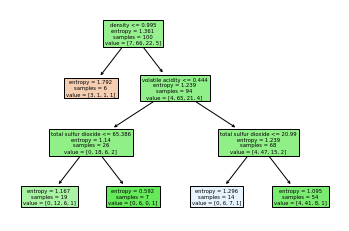

In [92]:
tree.plot_tree(dt_ccp_new,filled=True,feature_names=x1.columns)

### Bagging Classifier

#### DT

In [93]:
x=df.drop(columns=['quality'])
y=df.quality

In [94]:
from sklearn.ensemble import BaggingClassifier

x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

In [95]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(),n_estimators=10)
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [96]:
bag_dt.predict(x_test)

array([5, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 4, 6, 7, 7, 5, 5, 6, 6, 5,
       6, 7, 5, 5, 5, 6, 5, 6, 6, 6, 6, 5, 7, 7, 5, 5, 6, 6, 5, 7, 6, 7,
       6, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 7, 5, 5, 5, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 5, 4, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 4, 5,
       5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 7, 7, 6, 5, 5, 5, 5, 5, 6, 5,
       6, 5, 7, 6, 6, 5, 5, 7, 7, 6, 5, 6, 5, 5, 6, 7, 5, 5, 6, 6, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 7, 6, 5, 5, 5, 7, 5, 5,
       6, 6, 6, 5, 6, 6, 6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 5, 6,
       7, 7, 7, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 5, 7, 6, 5,
       5, 6, 7, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 6, 7, 6, 6, 5, 6,
       4, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 4, 5, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6,

In [97]:
bag_dt.score(x_test,y_test)

0.6475

In [98]:
bag_dt.score(x_train,y_train)

0.9841534612176814

In [99]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [105]:
bag_dt.estimator_params

()

In [106]:
bag_dt.base_estimator_

DecisionTreeClassifier()

#### KNN

In [109]:
from sklearn.neighbors import KNeighborsClassifier

In [110]:
bag_knn=BaggingClassifier(KNeighborsClassifier(6),n_estimators=10)
bag_knn.fit(x_train,y_train)
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5, 7, 6, 5, 5, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 7, 6, 6, 5, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 5, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 6, 5,
       5, 7, 7, 7, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 7, 5, 6, 6, 6, 5, 6, 6, 6, 5,
       6, 5, 6, 6, 5, 6, 5, 7, 7, 6, 5, 7, 6, 5, 7, 5, 5, 5, 5, 6, 5, 5,
       5, 7, 6, 5, 6, 5, 6, 5, 6, 6, 5, 5, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6,
       6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 6,
       7, 7, 6, 5, 5, 6, 6, 5, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       6, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 7, 6, 6, 6, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5, 6, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5,

In [111]:
bag_knn.score(x_test,y_test)

0.465

In [112]:
bag_knn.score(x_train,y_train)

0.6480400333611342